<h3><center><font color = "blue">스마트 홈 관련 코스피 상장사 중 테마주 정보를 중심으로 'Efficient Frontier' 제시</font></h3> 
<h4><p style='text-align: right;'><font color = "blue">(산업분석을 목표로)</font></p></h4>  

_**INTRODUCTION**_
    
    과거 지능형 주택으로 불리던 1990년 경의 스마트 홈 시장은, MicroSoft에 의해, 국내 IT 유수기업 간 모바일 익스플로러(MME) 협력 
    개발이 착수된  2000년 6월 경을 촉매로하여, 스마트홈 시장은 꾸준한 발전 가도 위에 있다. 
    최근 3년 간은 정부 역시 해당시장에 관심도를 높이며, 스마트홈을 포함한 AI 관련 시장에 4.7조원 투자할 만큼, 20년 간 위 시장은 제법 
    안정적인 시장상황을 구축해 왔으며, 지난 발전 동향을 미루어보아, 향 후 미래 역시 안정적인 시장일 것임을 기대할 수 있다.

    그러나, 익히 알 듯, 경제는 급격히 변화하며, 경제상황은 예측할 수 없는 영역이기에, 이를 대비할 대책을 마련하기 위한 취지로, 본 프
    로제트는 시작되었다. 

    본 프로젝트에서는 과거 유수 기업 사이의 주식시장 정보를 활용하여 효율적 투자를 이루기 위한 방책을 제시하고자 한다.
    과거 시장의 변화를 통해 어떤한 변화가 잇따라 왔는지 를 분석하고, 미래 시장에 대한 '기대'와 '실제'가 얼마나 일치될 수 있는지를 예
    측해 보려고한다.

    
_**관련 주식시장 Code정보**_
    
        - 에스원 : 012750
        - HDC 아이콘트롤스 : 039570
        - 경동나비엔 : 009450 
        - 현대리바트 : 079430
        - 엘지전자 : 066570
        - 삼성전자 : 005930
        - 지에스건설 : 006360
        - 에스케이텔레콤 : 017670
        - 케이티 : 030200
        - 엘지유플러스 : 032640

In [1]:
import requests
import pandas as pd
import numpy as np
import datetime as dt
import time

from scipy import stats
from functools import reduce
from datetime import date

# For Visualization
import matplotlib.pyplot as plt
import seaborn as sns 
import statsmodels.api as sm
import chart_studio.plotly as py
import plotly.graph_objs as go

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from matplotlib import pyplot

%matplotlib inline

# Error fix
import warnings
warnings.simplefilter("ignore")

plt.rc('font', family='Malgun Gothic') 
plt.rc('axes', unicode_minus=False)

# File Check
import os

# Modeling
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [20]:
def cr_df(company, number = 2):
    # list_1
    df_save = []
    recent_date = ['2021-01-31']
    df_save.append(pd.DataFrame(recent_date, columns=['date']))
    # list_2
    params = []
    for i in range(number):
        params.append({
            'access_key': '21ab33d30ae3b6ebcb1e5727a699f17d',
            'date_to' : df_save[i]['date'].tail(1)
        })
        api_result = requests.get(f'https://api.marketstack.com/v1/tickers/{company}/eod', params[i])
        api_response = api_result.json()
        df_save.append(pd.DataFrame(api_response['data']['eod']))
    return pd.concat(df_save).drop(index=0).reset_index().drop_duplicates("date", keep="first")

In [2]:
stock_info = ['에스원 012750', 
              'HDC아이콘트롤스 039570',
              '경동나비엔 009450', 
              '현대리바트 079430',
              '엘지전자 066570',
              '삼성전자 005930',
              '지에스건설 006360',
              '에스케이텔레콤 017670',
              '케이티 030200',
              '엘지유플러스 032640']

stock_name_list = []
stock_code_list = []
for i in range(len(stock_info)):
    sl = stock_info[i].split(' ')
    stock_name_list.append(sl[0])
    stock_code_list.append(sl[1])
# stock_name_list , stock_code_list    

In [13]:
# 해당 주식정보 불러오기
def c_str(tx):
    return tx + '.XKRX'
symbols = pd.Series(stock_code_list).to_frame()[0].apply(c_str)

Sk_by_comp = []
sym_list = symbols.tolist()
for stock in range(10):
    Sk_by_comp.append(cr_df(sym_list[stock], number = 53))
    Sk_by_comp[stock]['symbol'] = np.repeat(stock_name_list[stock], len(Sk_by_comp[stock]), axis=0)

In [3]:
# 파일 csv변환 및 변환된 파일 불러오기
Sk_by_comp_n = []
for i in range(10):
    sk_name = stock_name_list[i]
#     Sk_by_comp[i].to_csv(f'Data/skinfo_{sk_name}.csv',index=False)
    Sk_by_comp_n.append(pd.read_csv(f'Data/skinfo_{sk_name}.csv'))
# 파일 저장상태 확인
def get_file_list_title(sk_name):
    file_list = []
    for root, dirs, files in os.walk("Data/"):
        for filename in files:
            if filename.startswith(f'skinfo_{sk_name}'):
                file_list.append(filename)
    return sorted(file_list)
for i in range(10):
    print(get_file_list_title(stock_name_list[i]))    
# 각 회사의 마지막 주식 날짜정보 확인
print('Company    ','   index &last_date')
print(65*'-')
for i in range(len(stock_info)):
    print(Sk_by_comp_n[i]['symbol'][0], Sk_by_comp_n[i].tail(1)['date'])    

['skinfo_에스원.csv']
['skinfo_HDC아이콘트롤스.csv']
['skinfo_경동나비엔.csv']
['skinfo_현대리바트.csv']
['skinfo_엘지전자.csv']
['skinfo_삼성전자.csv']
['skinfo_지에스건설.csv']
['skinfo_에스케이텔레콤.csv']
['skinfo_케이티.csv']
['skinfo_엘지유플러스.csv']
Company        index &last_date
-----------------------------------------------------------------
에스원 5246    1999-09-22T00:00:00+0000
Name: date, dtype: object
HDC아이콘트롤스 1310    2015-09-24T00:00:00+0000
Name: date, dtype: object
경동나비엔 5246    1999-10-05T00:00:00+0000
Name: date, dtype: object
현대리바트 3752    2005-11-23T00:00:00+0000
Name: date, dtype: object
엘지전자 4640    2002-04-24T00:00:00+0000
Name: date, dtype: object
삼성전자 5246    1999-10-21T00:00:00+0000
Name: date, dtype: object
지에스건설 5246    1999-10-26T00:00:00+0000
Name: date, dtype: object
에스케이텔레콤 5246    1999-10-22T00:00:00+0000
Name: date, dtype: object
케이티 5246    1999-10-26T00:00:00+0000
Name: date, dtype: object
엘지유플러스 5016    2000-10-06T00:00:00+0000
Name: date, dtype: object


---

In [4]:
# 년 월 일 데이터만 선별하여 Date time 화 하고 이를 시계열 분석을 위해 Index로 설정
for j in range(10) :
    Sk_by_comp_n_each = Sk_by_comp_n[j].copy()

    Date_list = []
    for i in range(Sk_by_comp_n_each.shape[0]):
        semi_r = Sk_by_comp_n_each.iloc[:,1][i].split('T')
        semi_r_n = dt.datetime.strptime(semi_r[0], '%Y-%m-%d').date()
        Date_list.append(semi_r_n)
    print(Sk_by_comp_n_each['symbol'][0], 'Number of rows and columns')        
    print(Sk_by_comp_n_each.shape)
    Sk_by_comp_n_each['date'] = Date_list
    Sk_by_comp_n_each.set_index('date', inplace=True)
    Sk_by_comp_n[j] = Sk_by_comp_n_each
print(65*'-')
for date in range(len(Sk_by_comp_n)):
    company = Sk_by_comp_n[date]['symbol'][0]
    print(f'{company}_Confirm the final result: ', Sk_by_comp_n[date].index[-1])

에스원 Number of rows and columns
(5247, 14)
HDC아이콘트롤스 Number of rows and columns
(1311, 14)
경동나비엔 Number of rows and columns
(5247, 14)
현대리바트 Number of rows and columns
(3753, 14)
엘지전자 Number of rows and columns
(4641, 14)
삼성전자 Number of rows and columns
(5247, 14)
지에스건설 Number of rows and columns
(5247, 14)
에스케이텔레콤 Number of rows and columns
(5247, 14)
케이티 Number of rows and columns
(5247, 14)
엘지유플러스 Number of rows and columns
(5017, 14)
-----------------------------------------------------------------
에스원_Confirm the final result:  1999-09-22
HDC아이콘트롤스_Confirm the final result:  2015-09-24
경동나비엔_Confirm the final result:  1999-10-05
현대리바트_Confirm the final result:  2005-11-23
엘지전자_Confirm the final result:  2002-04-24
삼성전자_Confirm the final result:  1999-10-21
지에스건설_Confirm the final result:  1999-10-26
에스케이텔레콤_Confirm the final result:  1999-10-22
케이티_Confirm the final result:  1999-10-26
엘지유플러스_Confirm the final result:  2000-10-06


#### Volume Trend Visualization

##### Volume Trend를 확인 하기 전에 각각의  Volume(거래량)에 대한 이상치를 Model을 통해 확인하다.

_**적용 모델 목록**_
    - ARIMA Model을 통한 계절성 값 분석
    - IForest
    

###### <font color = "blue">ARIMA For Anomaly Detection of Volume Trend</font> 

###### Rolling 하여 전반적인 추세선 확보

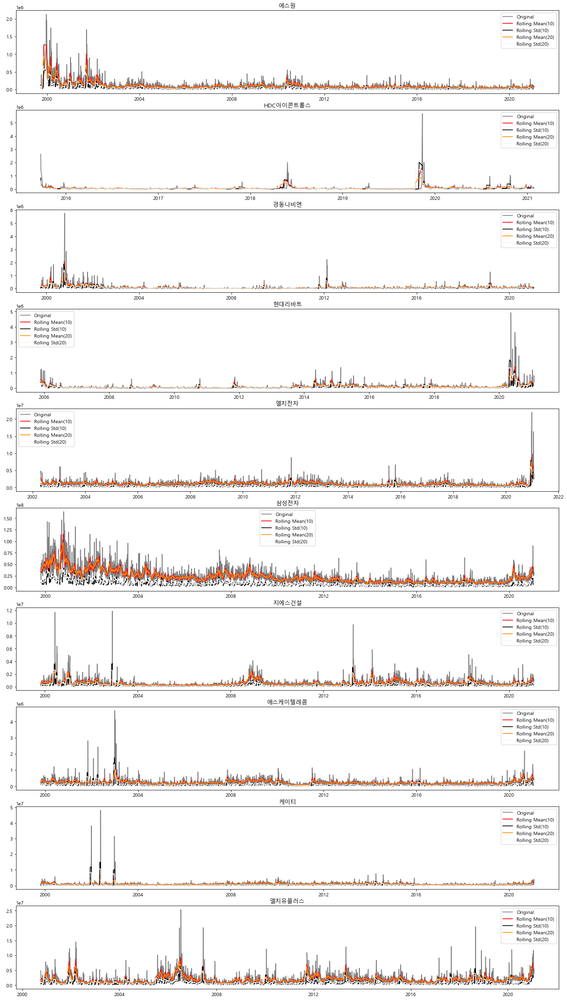

In [5]:
# 이동편균선
Sk_by_comp_n_cp = Sk_by_comp_n.copy()
fig = plt.figure(figsize=(20,37))
for i in range(len(Sk_by_comp_n_cp)):
    ax = plt.subplot(10,1,i+1)
    r_mean_1 = Sk_by_comp_n[i]["volume"].rolling(10).mean()
    r_mean_2 = Sk_by_comp_n[i]["volume"].rolling(20).mean()
    r_std_1 = Sk_by_comp_n[i]["volume"].rolling(10).std()
    r_std_2 = Sk_by_comp_n[i]["volume"].rolling(20).std()
    orig = plt.plot(Sk_by_comp_n[i]["volume"], color='gray',label='Original')
    mean = plt.plot(r_mean_1, color='red', label='Rolling Mean(10)')
    std = plt.plot(r_std_1, color='black', label = 'Rolling Std(10)')
    mean_ = plt.plot(r_mean_2, color='darkorange', label='Rolling Mean(20)')    
    std_ = plt.plot(r_std_2, color='whitesmoke', label = 'Rolling Std(20)')
    ax.set_title(str(Sk_by_comp_n_cp[i]['symbol'][0]))
    plt.legend(loc='best')

###### ACF, PACF 를 통한 Stationarity 확인


            
_**기대값과 분산은, Time에 의해 파생된 것이 아니므로, 시간역에서 확률분포가 일정해야한다.**_
- $X_1, X_2, ..., X_t$ a **sequence of a random variable 가정** 
- $E(x_t) = \mu, \;\;V(x_t) = \sigma_x^2$
\
\
$Pa(h) = \left\{\begin{array}\\ 
            1, \;\;\;Where \;\; h=0\\    
            0, \;\;\;Where \;\; h \neq 0
            \end{array}
            \right.$
\


**- 하단은 각 회사 주식의 Volume(거래량)을 중심으로 ACF 와 PACF 값을 결과시 한 것이다.
특히, ACF 값을 통해 확인 할 수 있었던 것은 에스원,  지에스건설, 엘지유플러스가 지속적으로 감소하는 값을 가진 것으로 보아 None-
Stationary 함을 확인할 수 있었다. 
본 분석가는, 상단의 이동평균을 통해 확보한 추세선을 통해서는 '에스원'의 거래량이 전반적으로 평이하다고 생각하였으나, 
ACF를 통해 Non-Stationary가 확인되므로, 2000년 초 경의 높은 값들이 이 외의 동향에 비해 상대적으로 매우 큰 거래에 해당했던 것임을 
유추할 수 있었다.
더불어, '지에스건설'과 '엘지유플러스'는 상대적으로 많은 거래량이 있던 시기가 눈에 띄게 확인되고있다.**   

---

_**St1 : Accumulative standard deviation**_ \
\
$v = \frac{\sum_{i=1}^{n} \;(X_t - \overline{X})}{n}$

    - wd = 'window' : window 값은 순차적으로 넓혀지며, 해당 std(표준편차) 해당 기간의 표준편차값을 확보.

_**St2 : Diff between standard deviations**_

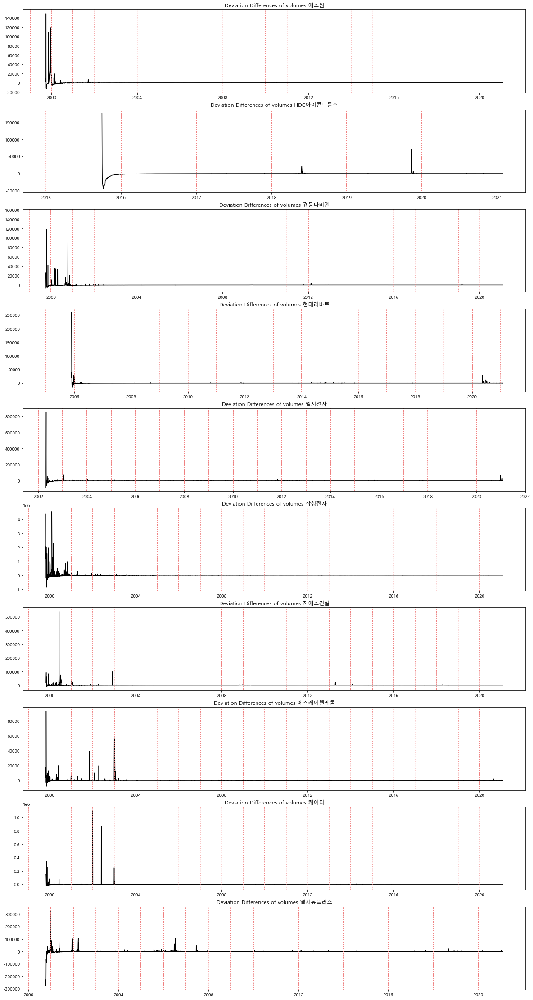

In [6]:
fig = plt.figure(figsize=(20,40))
for company in range(len(Sk_by_comp_n)):
    ax = plt.subplot(10,1,company+1)
    Test_table = Sk_by_comp_n[company].sort_values(by="date",ascending=True)
    V_deviations = pd.Series(dtype=float, index = Test_table.index)        
    for DT in V_deviations.index:
        wd = Test_table.loc[:DT]["volume"]
        V_deviations.loc[DT] = wd.std()
    V_deviations_diff = V_deviations.diff().dropna()
    # Visualization process    
    plt.plot(V_deviations_diff, color='black')
    ax.set_title(str('Deviation Differences of volumes ' + Sk_by_comp_n[company]['symbol'][0]))
    # Relatively outstanding different periodic values        
    T = V_deviations_diff[V_deviations_diff > np.mean(V_deviations_diff)].index
    for i in range(len(T) -1):
        year = T[i].year
        plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='lightcoral', linestyle=':', alpha=0.5)

_**St3 : Based on Srima Model, monthly trend of standard deviation has been verified**_ \
_**St4 : Selecting the unique period as abnormal value**_ 

    - 회색선은_ 약 20년 동안의 거래량 정보를,
    - 파란선은_ 각 월의 거래 변화량의 트렌드 정보를,
    - 빨간 실선은, 파란선(각 월의 거래 변화량의 트렌드 정보)에 기반하여 도출한 것이며, 모든 기간 안에서 가장 특징적인 변화량을 보인 특정일자를 선별
    
<font color = "red"><center>_**빨간 실선은 일반적이지 않은 특정한 값 변화 양상 즉, 이상치 정보로 해석할 수 있으며, 본 분석가는 이상치 정보가 출연한 정보를 중심으로 보다 세밀한 트렌드탐색을 진행해 갈 것이다.**_</font><center>

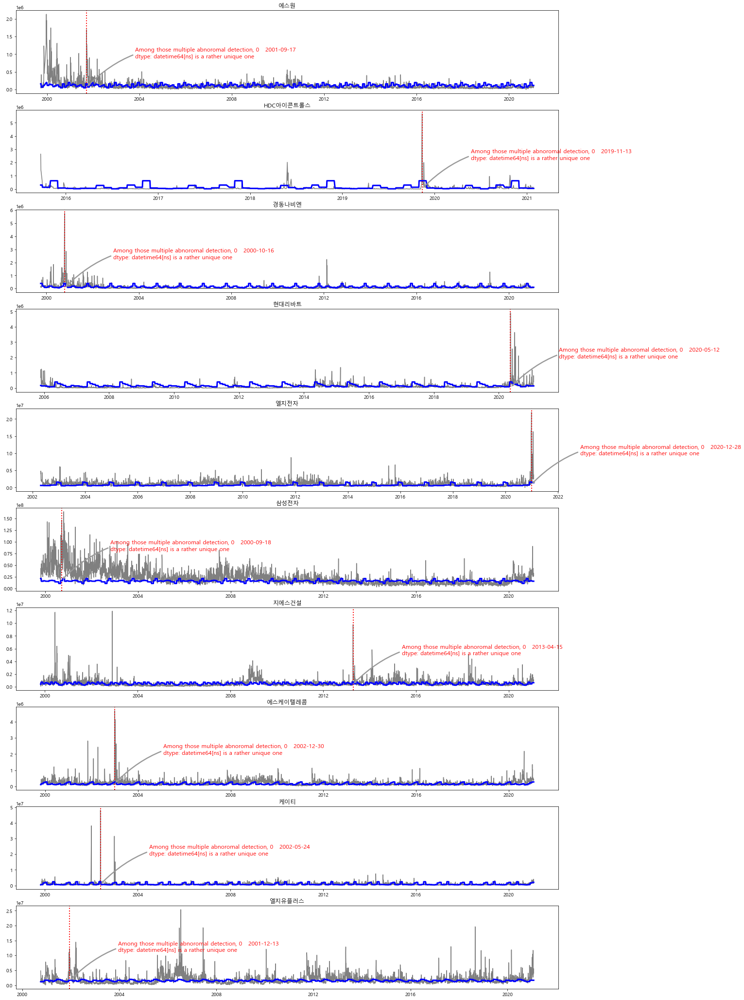

In [7]:
fig = plt.figure(figsize=(20,37))
for j in range(10) :
    Sk_by_comp_n_each = Sk_by_comp_n[j].copy()
    Sk_by_comp_n_each['month_trend'] = None
    SARIMA_t = []
    for i in range(len(Sk_by_comp_n_each)):    
        # 20년 동안의 각 회사별 각 Month(1월 ~ 12월) volume(거래량) 정보에 대한 std 산출     
        M_deviations = Sk_by_comp_n_each['volume'].groupby(lambda x : x.month).std()
        # 각 Month(1월 ~ 12월) volume(거래량)의 std 정보에 대한 diff 산출
        t = M_deviations.diff()
        # diff 값이 가장 큰 월에 대한 정보들을 본 데이터 프레임에서 True / False로 구분
        SARIMA_t.append(Sk_by_comp_n_each.index[i].month == np.where(t == M_deviations.diff().max())[0][0] +1)
        
        if  Sk_by_comp_n_each.index[i].month == 1:
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[1]
        elif Sk_by_comp_n_each.index[i].month == 2:
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[2]
        elif Sk_by_comp_n_each.index[i].month == 3:
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[3]
        elif Sk_by_comp_n_each.index[i].month == 4:
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[4]
        elif Sk_by_comp_n_each.index[i].month == 5:
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[5]
        elif Sk_by_comp_n_each.index[i].month == 6:
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[6]
        elif Sk_by_comp_n_each.index[i].month == 7:
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[7]
        elif Sk_by_comp_n_each.index[i].month == 8:
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[8]
        elif Sk_by_comp_n_each.index[i].month == 9:
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[9]
        elif Sk_by_comp_n_each.index[i].month == 10:
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[10]
        elif Sk_by_comp_n_each.index[i].month == 11:
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[11]
        else: 
            Sk_by_comp_n_each['month_trend'][i] = M_deviations[12]
            
    # month_trend : 약 20년 동안의 거래량 정보 중 각 월(1월 ~ 12월) 거래량의 대표값을 추정하였으며,
    # month_trend.approx(Approximation) : 해당 정보의 근사값을 도출하여 각 회사 주식정보 DataFrame에 적재.    
    Sk_by_comp_n_each['month_trend_approx'] = pd.to_numeric(Sk_by_comp_n_each['month_trend'],errors = 'coerce').round()
     # month_trend 중 대표 월을 선정하기 위해, trend에 대한 특성이 가장 두드러진 월 정보만을 구분하여 추출
    result = Sk_by_comp_n_each.loc[Sk_by_comp_n_each.index[SARIMA_t]].sort_values(by='date',ascending=True)['volume']    
        
    # 해당 일자를 제외한 나머지 일자 간의 std 값 중 가장 작은 값을 유도하는 일자가 가장 거래량의 변화가 큰 기간으로 추정
    # 위와 같은 논리로, Anomaly detection 진행
    SARIMA_std = []
    value_anomaly = []
    for dte in result.index:
        stdt = result[result.index != dte]
        SARIMA_std.append(stdt.std())
    d = {'col1': result.index, 'col2': SARIMA_std}    
    dev_frame = pd.DataFrame(d)
    value_anomaly_x = dev_frame[dev_frame['col2'] == min(SARIMA_std)]['col1']
    a = str(value_anomaly_x)
    t = pd.DataFrame({'year' : [a.split('-')[0][-4:]], 'month' : [a.split('-')[1]], 'day' : [a.split('-')[2][0:2]]})
    value_anomaly_n = pd.to_datetime(t)
    # 반복적으로 시각화를 진행    
    ax = plt.subplot(10,1,j+1)
    plt.plot(Sk_by_comp_n[j]["volume"], color='gray',label='Original')
    plt.axvline(value_anomaly_n, color='red', linestyle=':', alpha=1, lw = 2)
    plt.annotate(f'Among those multiple abnoromal detection, {value_anomaly_n} is a rather unique one',
                 color='red',
                 fontsize=15,
                 xy=(value_anomaly_n, round(np.median(Sk_by_comp_n[j]['volume']))), xycoords='data',
                 xytext=(100, 60), textcoords='offset points',
                 size=12,
                 arrowprops=dict(arrowstyle="simple",
                                 fc="0.6", ec="none",
                                 connectionstyle="arc3,rad=0.3"))
    plt.plot(Sk_by_comp_n_each['month_trend_approx'], color='blue', lw=3, label='Original')
    ax.set_title(str(Sk_by_comp_n[j]['symbol'][0]))

---

###### <font color = "blue">Isolation Forest For Anomaly Detection of Volume Trend</font> 

**하단은, 보유한 데이터의 해당 회사의 주식 정보에 기록에 대한 시작일자와, \
SARIMA Model을 통해 Anormaly Detection을 했을 때의, Abnormal Value가 관측된 년도와 월을 기재한 것이다.**

**본, 해석에 들어가기에 앞서, 1년 터울 간격으로 유사한 변동 양상을 보인 해당 회사 간의 Volume Trend에 대한 변화를 보다 면밀히 살펴보기 위해, 대표로 4개의 회사를 선택 및 그룹을 생성하여 상대적인 값을 비교하고자 하였다.**
\
\
    *: 에스원 from 2000년 \\ 2001년 9월 \
	*: 경동나비엔 from 2000년 \\ 2000년 10월 \
	*: 삼성전자 from 2000년 \\ 2000년 9월 \
    *: 지에스건설 from 2000년 \\ 2001년 12월 
****
    *: 에스케이텔레콤 from 2000년 2002년 12월
    
<center><img src="./Image/Techinical_background.PNG" width=1000 height=300></center>
<center><img src="./Image/Sales_forecast.PNG" width=1000 height=300></center>

***St1: I have selected 4 companies and made it into the new data frame as it has shown similar/homogenous volume pattern.***

In [5]:
def Create_new_df_volume(Selecting_cp, End_date):    
    Selecting_vol = []
    for company in range(10):
        cp_name = str(Sk_by_comp_n[company]['symbol'][0])
        if cp_name in Selecting_cp:
            # st_date_loc = np.where(Sk_by_comp_n[company].sort_values(by='date', ascending=True).index == pd.to_datetime(Start_date))[0][0] 
            ed_date_loc = np.where(Sk_by_comp_n[company].sort_values(by='date', ascending=True).index == pd.to_datetime(End_date))[0][0]
            Selecting_vol.append(pd.DataFrame(Sk_by_comp_n[company].sort_values(by='date', ascending=True).iloc[:ed_date_loc,5])) 
    return Selecting_vol

Sel_cp_df = Create_new_df_volume(stock_name_list, '2021-01-28')
for i in range(10):
    print('거래기록 시작일', Sel_cp_df[i].index[0])
    print('거래기록 종료일', Sel_cp_df[i].index[-1], Sk_by_comp_n[i]['symbol'][0])
    print('-'*50)

def iforest_func(nth, contamination):
    Classification = IsolationForest(n_estimators=100, max_samples='auto', contamination=contamination, \
                                     max_features=1.0, bootstrap=False, n_jobs=-1, random_state=None, verbose=0)
    Classification.fit(Sel_cp_df[nth][['volume']])
    Sel_cp_df[nth]['Scores'] = Classification.decision_function(Sel_cp_df[nth][['volume']])
    
    # Classification and Prediction of Network Abnormal Data(CPNAD)
    Sel_cp_df[nth]['CPNAD'] = Classification.predict(Sel_cp_df[nth][['volume']])
    Sel_cp_df[nth].loc[Sel_cp_df[nth]['CPNAD'] == 1, 'CPNAD'] = 0
    Sel_cp_df[nth].loc[Sel_cp_df[nth]['CPNAD'] == -1, 'CPNAD'] = 1
    Sel_cp_df[nth]['CPNAD'].value_counts()
    
for nth in range(10):
    iforest_func(nth, float(.005))
    time.sleep(2)     

거래기록 시작일 1999-09-22
거래기록 종료일 2021-01-27 에스원
--------------------------------------------------
거래기록 시작일 2015-09-24
거래기록 종료일 2021-01-27 HDC아이콘트롤스
--------------------------------------------------
거래기록 시작일 1999-10-05
거래기록 종료일 2021-01-27 경동나비엔
--------------------------------------------------
거래기록 시작일 2005-11-23
거래기록 종료일 2021-01-27 현대리바트
--------------------------------------------------
거래기록 시작일 2002-04-24
거래기록 종료일 2021-01-27 엘지전자
--------------------------------------------------
거래기록 시작일 1999-10-21
거래기록 종료일 2021-01-27 삼성전자
--------------------------------------------------
거래기록 시작일 1999-10-26
거래기록 종료일 2021-01-27 지에스건설
--------------------------------------------------
거래기록 시작일 1999-10-22
거래기록 종료일 2021-01-27 에스케이텔레콤
--------------------------------------------------
거래기록 시작일 1999-10-26
거래기록 종료일 2021-01-27 케이티
--------------------------------------------------
거래기록 시작일 2000-10-06
거래기록 종료일 2021-01-27 엘지유플러스
--------------------------------------------------


_**<center>I was able to produce a reult, which is abnormal value that can be detected with 5% robability.</center>**_
_**<center>it showed cominated result.it showed cominated result.</center>**_

In [201]:

a = []
med = pd.DataFrame()
for idx, row in pd.DataFrame(Te).head(300).sort_values(by='date', ascending=True).iterrows():
    a.append(idx.year)
med['year'] = pd.Series(a)

,year
0,2019
1,2019
2,2019
3,2019
4,2019
...,...
295,2021
296,2021
297,2021
298,2021


In [210]:
type(Sel_cp_df[0]['Adj_close'])

pandas.core.series.Series

In [213]:
window

247

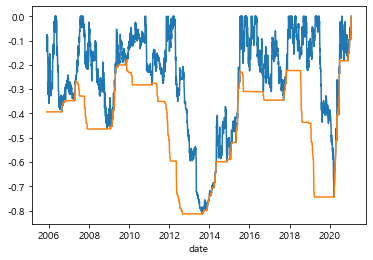

In [206]:
Te = Sk_by_comp_n[3]['adj_close'].copy()
count_year = []
sub_df = pd.DataFrame()
for idx, row in pd.DataFrame(Te).sort_values(by='date', ascending=True).iterrows():
    count_year.append(idx.year)
sub_df['year'] = count_year

window = int(sub_df.value_counts().median())  

# Calculate the max drawdown in the past window days for each day 
rolling_max = Te.rolling(window, min_periods=1).max()
daily_drawdown = Te/rolling_max - 1.0

# Calculate the minimum (negative) daily drawdown
max_daily_drawdown = daily_drawdown.rolling(window, min_periods=1).min()

# Plot the results

daily_drawdown.plot()
max_daily_drawdown.plot()

# Show the plot
plt.show()

In [ ]:
fig.add_trace(go.Scatter(x=month, y=high_2014, name='High 2014',
                         line=dict(color='firebrick', width=4)))

In [ ]:
def update_running_graph(n_intervals):
    df = pd.read_csv(filename)

    trace1 = go.Scatter(x=df['Timestamp'],
                        y=df['CLE'],
                        name='Crude',
                        mode='lines+markers',
                        yaxis='y1')
    trace2 = go.Scatter(x=df['Timestamp'],
                        y=df['y_pred'],
                        name='Model',
                        mode='lines+markers',
                        yaxis='y1')
    trace3 = go.Bar(x=df['Timestamp'],
                    y=df['ModelDiff'],
                    name='Diff',
                    yaxis='y2'
                    )
    data = [trace1, trace2,trace3]
    layout = go.Layout(title='CLE vs Model',
                       yaxis=dict(title='Crude and Model'),
                       yaxis2=dict(title='Moddel Difference',
                                   overlaying='y',
                                   side='right'))
    return go.Figure(data=data, layout=layout)

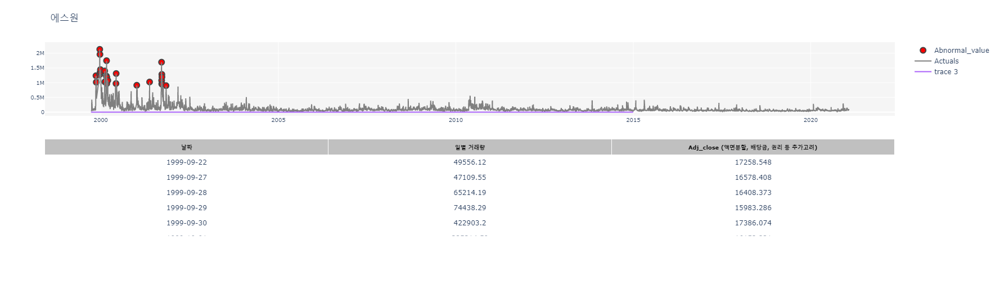

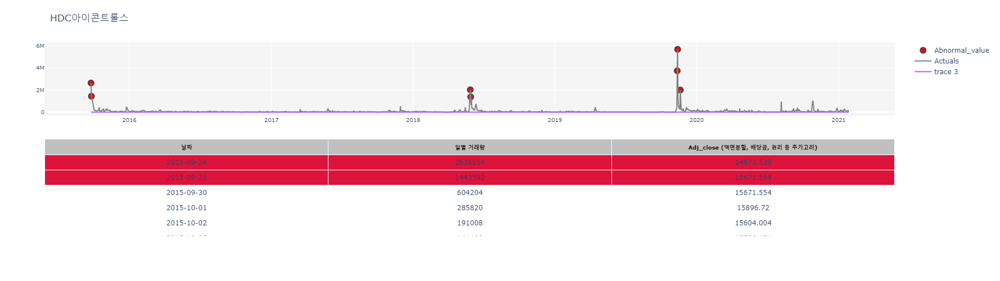

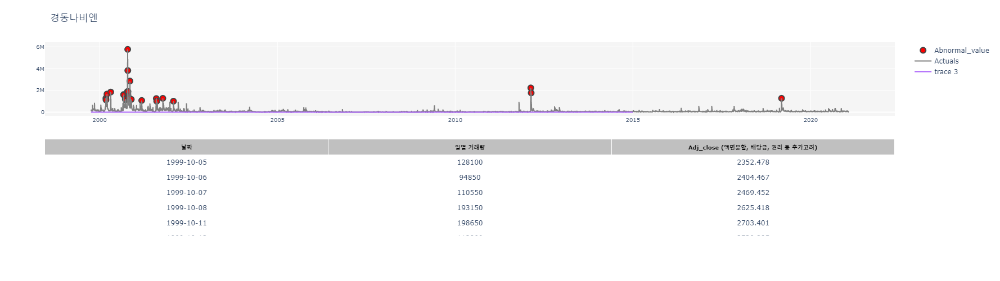

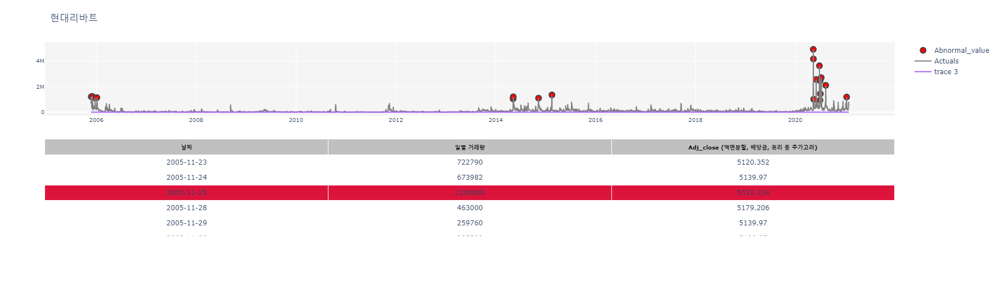

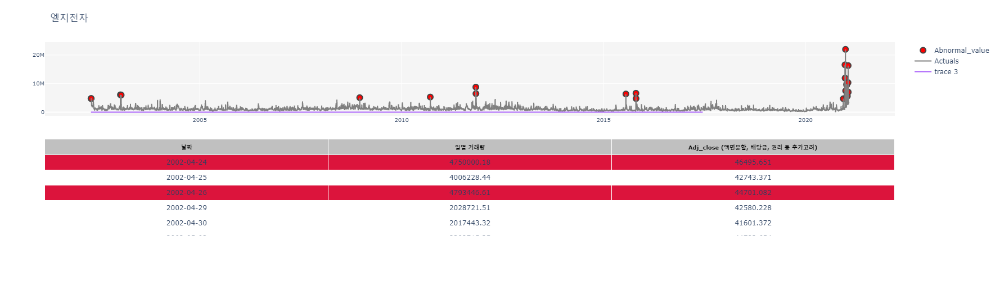

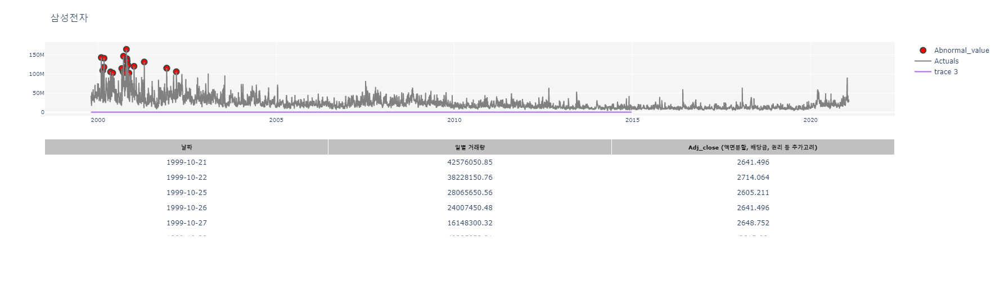

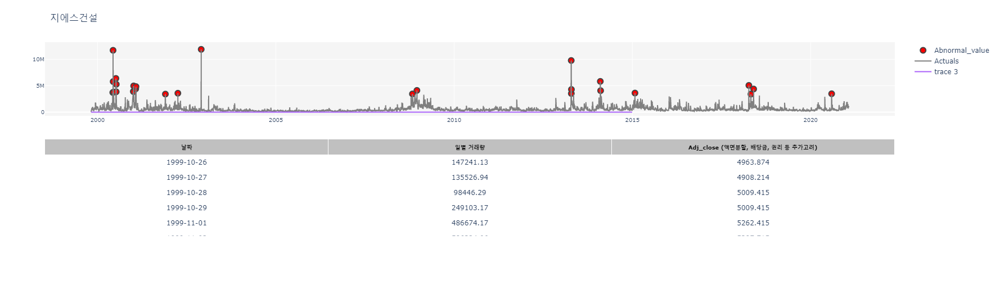

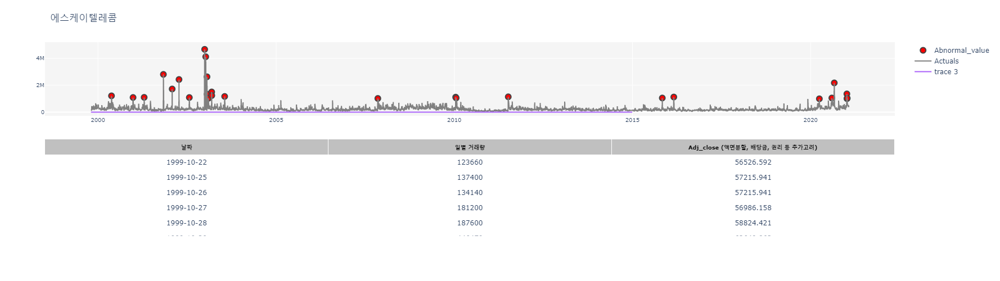

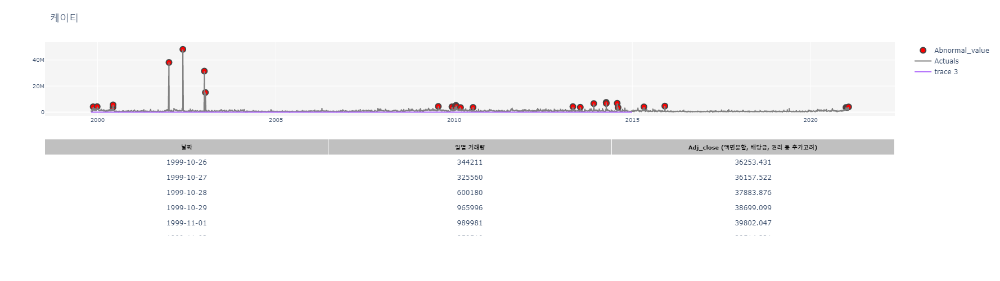

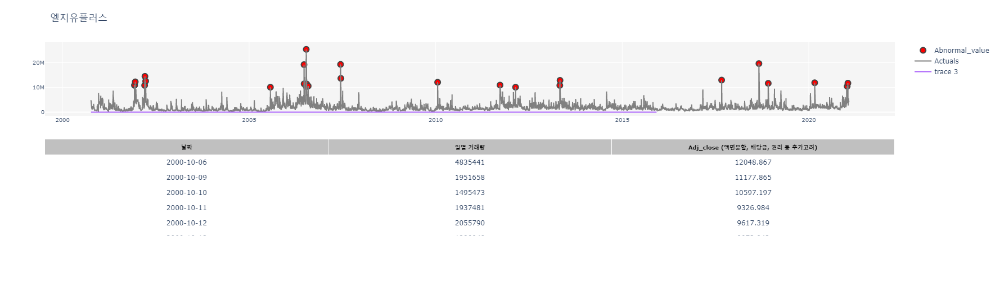

In [243]:
def plot_anomaly(nth,metric_name):
    Sel_cp_df[nth]['Timestamp'] = Sel_cp_df[nth].index
    Sel_cp_df[nth]['Adj_close'] = Sk_by_comp_n[nth]['adj_close'].copy()        
    dates = Sel_cp_df[nth].index
    
    # Drawdown을 위해 가장 적합한 window 단위를 탐색     
    count_year = []
    sub_df = pd.DataFrame()
    for idx, row in pd.DataFrame(Sel_cp_df[nth]['Adj_close']).iterrows():
        count_year.append(idx.year)
    sub_df['year'] = count_year
    window = int(sub_df.value_counts().median())      
    # Calculate the max drawdown in the past window days for each day 
    rolling_max = Te.rolling(window, min_periods=1).max()
    daily_drawdown = Te/rolling_max - 1.0
    # Optional_rolling      
    max_daily_drawdown = daily_drawdown.rolling(window, min_periods=1).min()    
    
    
    bool_array = (abs(Sel_cp_df[nth]['CPNAD']) > 0)
    actuals = Sel_cp_df[nth]["volume"][-len(bool_array):]
    CPNAD_points = bool_array * actuals
    CPNAD_points[CPNAD_points == 0] = np.nan

    #A dictionary for conditional format table based on anomaly
    color_map = {0: "white", 1: "crimson"}

    table = go.Table(
        domain=dict(x=[0, 1],
                    y=[0, 0.5]),
        columnwidth=[1, 1, 1],
        header=dict(height=27,
                    values=[['<b>날짜</b>'], ['<b>일별 거래량</b>'], ['<b>Adj_close (액면분할, 배당금, 권리 등 추가고려)</b>'],],
                    font=dict(color='black', size=10),
                    fill=dict(color='silver')),
        cells=dict(values=[Sel_cp_df[nth].round(3)[k].tolist() for k in ['Timestamp', 'volume', 'Adj_close']],
                   line=dict(color='white'),
                   align=['center'],
                   font=dict(size=12),
                   suffix=[None] + [''] + [''] + ['%'] + [''],
                   height=27,
                   fill=dict(color=[Sel_cp_df[nth]['CPNAD'].map(color_map)])))
    
    Actuals = go.Scatter(name='Actuals',
                         x=dates,
                         y=Sel_cp_df[nth]['volume'],
                         xaxis='x1', 
                         yaxis='y1',
                         mode='lines',
                         marker=dict(size=12,
                                     line=dict(width=2),
                                     color="gray"))
    anomalies_map = go.Scatter(name="Abnormal_value",
                               showlegend=True,
                               x=dates,
                               y=CPNAD_points,
                               mode='markers',
                               xaxis='x1',
                               yaxis='y1',
                               marker=dict(color="red",
                                           size=10,
                                           line=dict(
                                               width=2)))
#     Draw_down = go.Scatter(x=dates,
#                           y=max_daily_drawdown)
    
    axis = dict(
        ticklen=4,
        gridcolor='white',
        tickfont=dict(size=10))
    layout = dict(
        width=1500,
        height=500,
        autosize=False,
        title=metric_name,
        margin=dict(t=75),
        showlegend=True,
        plot_bgcolor='whitesmoke',
        xaxis1=dict(axis, **dict(domain=[0, 1], anchor='y1', showticklabels=True)),
        yaxis1=dict(axis, **dict(domain=[2 * 0.21 + 0.20, 1], anchor='x1', hoverformat='.2f')))
        
    fig = go.Figure(data=[table, anomalies_map, Actuals, Draw_down], layout=layout)
    iplot(fig)
    pyplot.show()
for idx in range(10):
    plot_anomaly(idx, stock_name_list[idx])

---

In [8]:
Sel_cp_df[0]

,volume,Scores,CPNAD,Timestamp
date,,,,
1999-09-22,49556.12,0.420459,0,1999-09-22
1999-09-27,47109.55,0.413292,0,1999-09-27
1999-09-28,65214.19,0.414112,0,1999-09-28
1999-09-29,74438.29,0.407304,0,1999-09-29
1999-09-30,422903.20,0.142851,0,1999-09-30
...,...,...,...,...
2021-01-21,47547.00,0.413722,0,2021-01-21
2021-01-22,84835.00,0.400683,0,2021-01-22
2021-01-25,64130.00,0.412075,0,2021-01-25
